In [1]:
import pandas as pd
import os
os.environ['CUDA_VISIBLE_DEVICES'] = "GPU-ff380879-d5b2-8469-da3d-71267d28a645"
import json
import numpy as np
import matplotlib.pyplot as plt
import segmentation_models_pytorch as smp
import torch
import torchvision.transforms as tvt
from PIL import Image
import seaborn as sns
from custom_segmentation.segmentation_model import ConvNext_FPN
import glob
from plot_utils import get_carla_plotting_elements

In [2]:
meta_df = pd.read_csv("carla_test_scenes.csv")


In [3]:
def get_mean_from_metric(file):
    df = pd.read_json(file, orient="index")
    # df['per_class'] = df['per_class'].apply(np.array)
    per_class_array = np.array(df['per_class'].tolist())
    return np.mean(df['weighted']), np.mean(per_class_array, axis= 0)


def get_segm_model(backbone, iteration=None):
    if backbone == "resnet50":
        model = smp.FPN(
                encoder_name = "resnet50",
                encoder_depth = 5,
                encoder_weights="imagenet",
                decoder_dropout=0.3,
                in_channels = 3,
                classes=23,
                activation=None
            ).cuda()
        weights = torch.load("checkpoint/CARLA_GEN_SEMANTIC_SEGMENTATION_resnet50(ENCODER)_FPN(DECODER)", map_location="cpu")
        model.load_state_dict(weights['model_state_dict'])
        model.eval()
    elif backbone == "MiT":
        model = smp.FPN(
                encoder_name = "mit_b3",
                encoder_depth = 5,
                encoder_weights="imagenet",
                decoder_dropout=0.3,
                in_channels = 3,
                classes=23,
                activation=None
            ).cuda()
        weights = torch.load("checkpoint/CARLA_GEN_SEMANTIC_SEGMENTATION_MiT(ENCODER)_FPN(DECODER)", map_location="cpu")
        model.load_state_dict(weights['model_state_dict'])
        model.eval()

    elif backbone == "EfficientNet":
        model = smp.FPN(
                encoder_name = "efficientnet-b6",
                encoder_depth = 5,
                encoder_weights="imagenet",
                decoder_dropout=0.3,
                in_channels = 3,
                classes=23,
                activation=None
            ).cuda()
        if iteration is None:
            weights = torch.load("checkpoint/CARLA_GEN_SEMANTIC_SEGMENTATION_efficientnet-b6(ENCODER)_FPN(DECODER)", map_location="cpu")
        else:
            weights = torch.load(f"checkpoint/kp_finetune/efficientnet-b6/CARLA_GEN_SEMANTIC_SEGMENTATION_efficientnet-b6(ENCODER)_FPN(DECODER)_{iteration}.pth", map_location="cpu")
        model.load_state_dict(weights['model_state_dict'])
        model.eval()
        
    elif backbone == 'ConvNext':
        model = ConvNext_FPN(classes=23).cuda()
        weights = torch.load("checkpoint/CARLA_GEN_SEMANTIC_SEGMENTATION_NA(ENCODER)_ConvNext_FPN(DECODER)", map_location='cpu')
        model.load_state_dict(weights['model_state_dict'])
        model.eval()
    return model


def make_prediction(image, backbone, iteration=None):
    model = get_segm_model(backbone)
    validation_image_transform = tvt.Compose([
        tvt.ToTensor(),
        tvt.Normalize(mean = [0.6823, 0.6725, 0.6617], std = [0.2613, 0.2605, 0.2646]),
        tvt.Pad(padding = [0,0,0,16])
    ])
    image = Image.open(image).convert("RGB")
    image = validation_image_transform(image)
    prediction = model(image.unsqueeze(dim = 0).cuda())
    prediction = tvt.functional.pad(img = prediction, padding=[0,0,0,-16])
    return prediction.squeeze().detach().cpu().numpy()


def get_image_path(angle, rain, fog, index = 63, model=3, image = True):
    datadir = "DATA/carla_test/"
    filtered = meta_df[(meta_df["sun_altitude_angle"]==angle) & (meta_df['precipitation']==rain) & (meta_df['fog_density']==fog)]
    case = filtered[filtered['scenarios'].str.contains(f"model{model}")].scenarios.values[0]
    if image:
        images = sorted(glob.glob(os.path.join(datadir, case, "rgb_clean", "*")))
    else:
        images = sorted(glob.glob(os.path.join(datadir, case, "seg", "*")))
    image = images[index]
    return image

def get_image_path_and_predict(angle, rain, fog, backbone, iteration):
    image = get_image_path(angle, rain, fog)
    prediction = make_prediction(image = image, backbone=backbone, iteration=iteration)
    return prediction



# make_prediction("/data_fast/venkatesh/carla/DATA/carla_test/test-fog0-rain0-model0-num200-angle-60/rgb_clean/0000000460.png", backbone="resnet50")

# get_mean_from_metric("/data_fast/venkatesh/carla/metrics/semantic/semantic_resnet50/test-fog0-rain0-model0-num200-angle0.json")

# Pre finetuning results

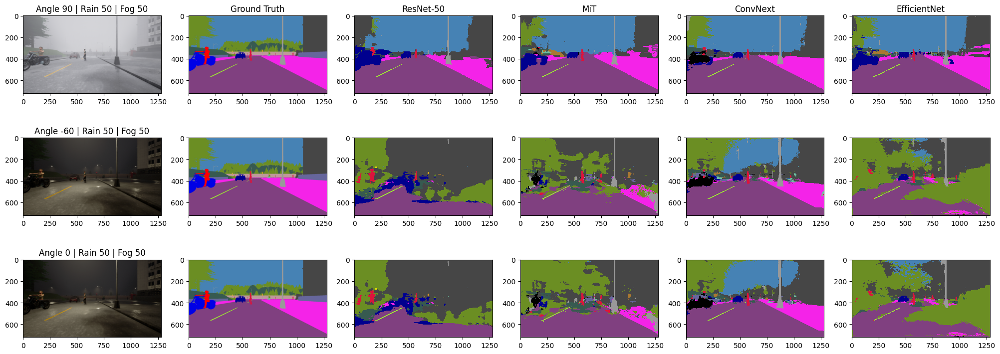

In [4]:
fig, ax = plt.subplots(nrows = 3, ncols=6, figsize=(25,9))
class_mapping, color_mapping, cmap, norm, patches = get_carla_plotting_elements()
fog = 50
rain = 50
ax[0][0].imshow(Image.open(get_image_path(90,fog, rain)))
ax[0][0].set_title(f"Angle 90 | Rain {rain} | Fog {fog}")
ax[1][0].imshow(Image.open(get_image_path(-60, fog, rain)))
ax[1][0].set_title(f"Angle -60 | Rain {rain} | Fog {fog}")
ax[2][0].imshow(Image.open(get_image_path(0, fog, rain)))
ax[2][0].set_title(f"Angle 0 | Rain {fog} | Fog {fog}")

ax[0][1].imshow(Image.open(get_image_path(90, fog, rain, image = False)))
ax[0][1].set_title(f"Ground Truth")
ax[1][1].imshow(Image.open(get_image_path(-60, fog, rain, image = False)))
ax[2][1].imshow(Image.open(get_image_path(0, fog, rain, image = False)))

ax[0][2].imshow(np.argmax(get_image_path_and_predict(90, fog, rain, "resnet50", None), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[0][2].set_title("ResNet-50")
ax[1][2].imshow(np.argmax(get_image_path_and_predict(-60, fog, rain, "resnet50", None), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[2][2].imshow(np.argmax(get_image_path_and_predict(0, fog, rain, "resnet50", None), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")

ax[0][3].imshow(np.argmax(get_image_path_and_predict(90, fog, rain, "MiT", None), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[0][3].set_title("MiT")
ax[1][3].imshow(np.argmax(get_image_path_and_predict(-60, fog, rain, "MiT", None), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[2][3].imshow(np.argmax(get_image_path_and_predict(0, fog, rain, "MiT", None), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")

ax[0][3].imshow(np.argmax(get_image_path_and_predict(90, fog, rain, "MiT", None), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[0][3].set_title("MiT")
ax[1][3].imshow(np.argmax(get_image_path_and_predict(-60, fog, rain, "MiT", None), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[2][3].imshow(np.argmax(get_image_path_and_predict(0, fog, rain, "MiT", None), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")

ax[0][4].imshow(np.argmax(get_image_path_and_predict(90, fog, rain, "ConvNext", None), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[0][4].set_title("ConvNext")
ax[1][4].imshow(np.argmax(get_image_path_and_predict(-60, fog, rain, "ConvNext", None), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[2][4].imshow(np.argmax(get_image_path_and_predict(0, fog, rain, "ConvNext", None), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")


ax[0][5].imshow(np.argmax(get_image_path_and_predict(90, fog, rain, "EfficientNet", None), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[0][5].set_title("EfficientNet")
ax[1][5].imshow(np.argmax(get_image_path_and_predict(-60, fog, rain, "EfficientNet", None), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[2][5].imshow(np.argmax(get_image_path_and_predict(0, fog, rain, "EfficientNet", None), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")

In [11]:
def make_heatmap(metric_dir, angles=[-60, 0, 90], rains=[0, 25, 50, 75, 100], fogs=[0, 25, 50, 75, 100], model=3):
    heatmap_dict = {}
    for angle in angles:

        heatmap = np.zeros(shape=[len(fogs), len(rains)])
        for i, fog in enumerate(fogs):
            for j, rain in enumerate(rains):
                filtered = meta_df[(meta_df['sun_altitude_angle']==angle) & (meta_df['precipitation']==rain) & (meta_df['fog_density']==fog)]
                scene = filtered[filtered['scenarios'].str.contains(f"model{model}")].scenarios.values[0]
                metric_file = os.path.join(metric_dir, f"{scene}.json")
                miou, iou_pc = get_mean_from_metric(metric_file)
                heatmap[i, j] = miou
        heatmap_dict[angle] = heatmap
    return heatmap_dict


hmap_iters_resnet = {}
iteration_0 = make_heatmap(metric_dir="/data_fast/venkatesh/carla/metrics/semantic/FPN/resnet50")
hmap_iters_resnet['iteration-0'] = iteration_0

iterations = [f"iteration-{i}" for i in range(1,27)]
for iter in iterations:
    datadir = "/data_fast/venkatesh/carla/metrics/kp_finetune/resnet50/"
    metric_dir = os.path.join(datadir, iter)
    hmap_iters_resnet[iter] = make_heatmap(metric_dir)


hmap_iters_efficientnet = {}
iteration_0 = make_heatmap(metric_dir="/data_fast/venkatesh/carla/metrics/semantic/FPN/efficientnet-b6/")
hmap_iters_efficientnet['iteration-0'] = iteration_0

iterations = [f"iteration-{i}" for i in range(1,27)]
for iter in iterations:
    datadir = "/data_fast/venkatesh/carla/metrics/kp_finetune/MiT/"
    metric_dir = os.path.join(datadir, iter)
    hmap_iters_efficientnet[iter] = make_heatmap(metric_dir)


hmap_iters_mit = {}
iteration_0 = make_heatmap(metric_dir="/data_fast/venkatesh/carla/metrics/semantic/FPN/mit_b3/")
hmap_iters_mit['iteration-0'] = iteration_0

iterations = [f"iteration-{i}" for i in range(1,27)]
for iter in iterations:
    datadir = "/data_fast/venkatesh/carla/metrics/kp_finetune/efficientnet-b6/"
    metric_dir = os.path.join(datadir, iter)
    hmap_iters_mit[iter] = make_heatmap(metric_dir)







# Coverage vs IOU

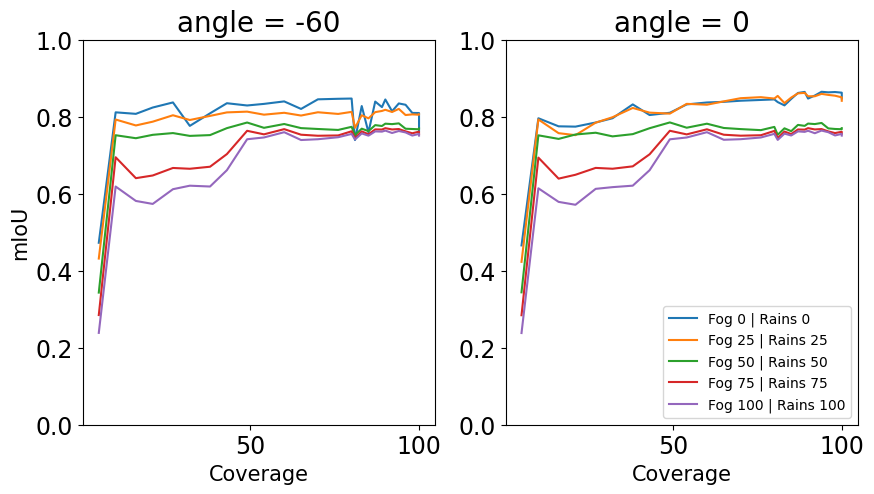

In [63]:

angles = [-60, 0]
rains=[0, 25, 50, 75, 100] 
fogs=[0, 25, 50, 75, 100]

# for angle in angles:
coverage = 100 * np.array([0.05454545454545454, 0.10909090909090909, 0.16363636363636364, 
            0.21818181818181817, 0.2727272727272727, 0.32727272727272727, 
            0.38181818181818183, 0.43636363636363634, 0.4909090909090909, 
            0.5454545454545454, 0.6, 0.6545454545454545, 0.7090909090909091, 
            0.7636363636363637, 0.8, 0.8181818181818182, 0.8363636363636363, 
            0.8545454545454545, 0.8727272727272727, 0.8909090909090909, 
            0.9090909090909091, 0.9272727272727272, 0.9454545454545454, 
            0.9636363636363636, 0.9818181818181818, 1.0, 1.0])

coverage = coverage.astype(int)

def get_mious(hmap_iters,angle, fog, rain):
    mious = []
    for iter in hmap_iters.keys():
        mious.append(hmap_iters[iter][angle][fog][rain])
    return mious


fig, axis = plt.subplots(nrows=1, ncols=2, figsize=(10,5))

for a,angle in enumerate(angles):
    for i in range(0, 5):
        for j in range(0, 5):
            if i == j:
                axis[a].plot(coverage, get_mious(hmap_iters_mit, angle = angle, fog = i, rain = j), label=f"Fog {fogs[i]} | Rains {rains[j]}")

    axis[a].tick_params(axis = "both", which="major", labelsize = 17)
    axis[a].set_xlabel("Coverage", fontsize = 15)
    if a == 0:
        axis[a].set_ylabel("mIoU", fontsize = 15)
    axis[a].set_title(f"angle = {angle}", fontsize = 20)
    axis[a].set_ylim([0,1])
# fig.suptitle("Semantic Segmentation resnet50 backbone")
plt.legend()
plt.show()

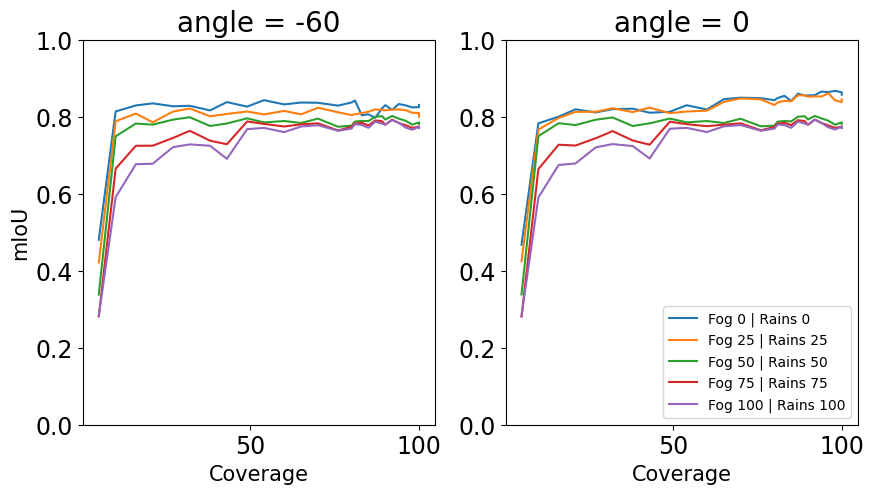

In [64]:
fig, axis = plt.subplots(nrows=1, ncols=2, figsize=(10,5))

for a,angle in enumerate(angles):
    for i in range(0, 5):
        for j in range(0, 5):
            if i == j:
                axis[a].plot(coverage, get_mious(hmap_iters_efficientnet, angle = angle, fog = i, rain = j), label=f"Fog {fogs[i]} | Rains {rains[j]}")

    axis[a].tick_params(axis = "both", which="major", labelsize = 17)
    axis[a].set_xlabel("Coverage", fontsize = 15)
    if a == 0:
        axis[a].set_ylabel("mIoU", fontsize = 15)
    axis[a].set_title(f"angle = {angle}", fontsize = 20)
    axis[a].set_ylim([0,1])
# fig.suptitle("Semantic Segmentation resnet50 backbone")
plt.legend()
plt.show()

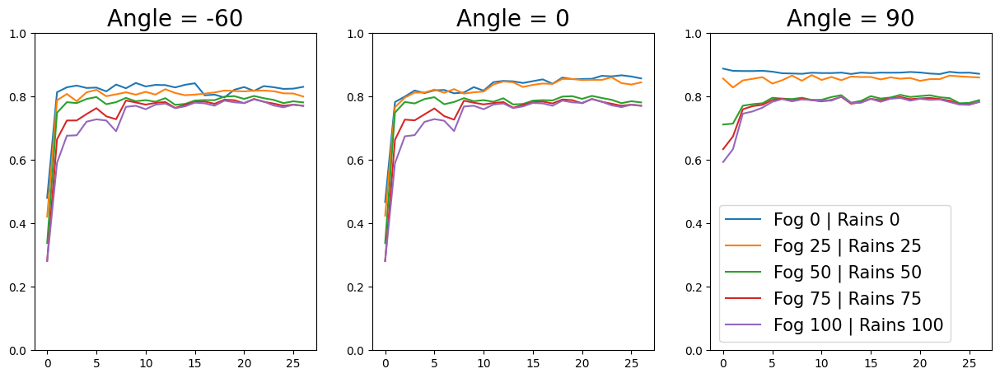

In [29]:
fig, axis = plt.subplots(nrows=1, ncols=3, figsize=(15,5))

for a,angle in enumerate(angles):
    for i in range(0, 5):
        for j in range(0, 5):
            if i == j:
                axis[a].plot(get_mious(hmap_iters_efficientnet, angle = angle, fog = i, rain = j), label=f"Fog {fogs[i]} | Rains {rains[j]}")
    axis[a].set_ylim([0,1])
    axis[a].set_title(f"Angle = {angle}", fontsize = 20)
    # if a == 0:
        # axis[a].set_xlabel("Iterations")
        # axis[a].set_ylabel("mIoU")

# fig.suptitle("MiT-b3 + FPN")
plt.legend(fontsize = 15)
plt.show()

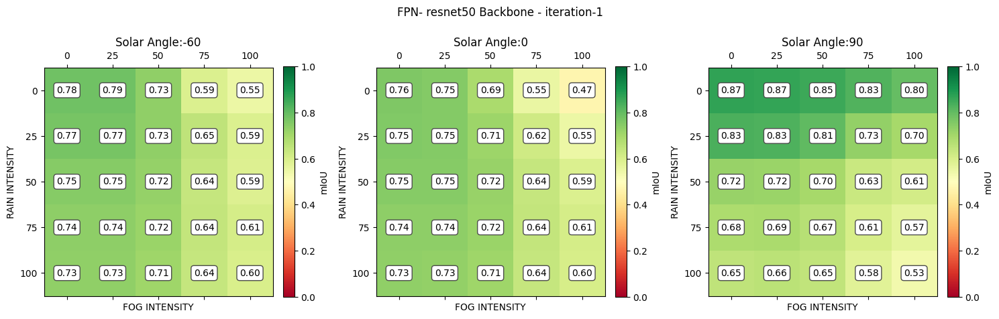

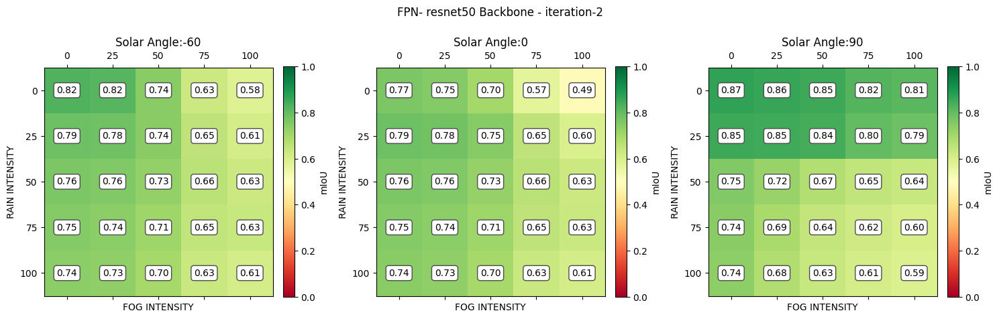

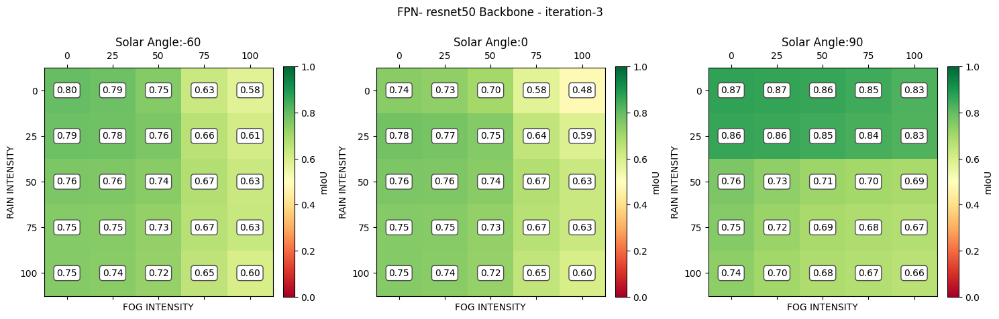

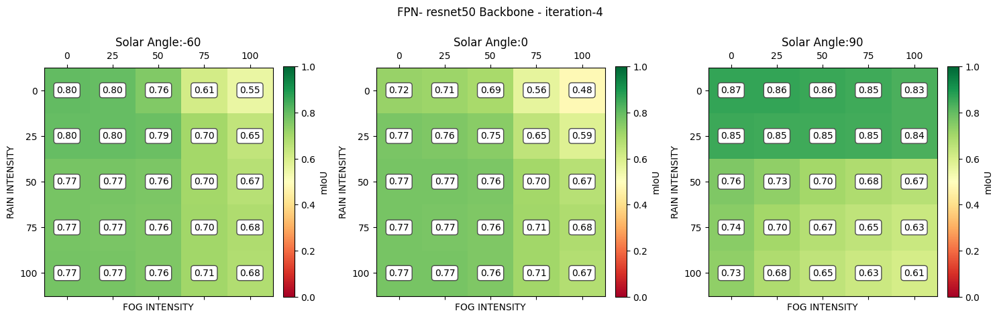

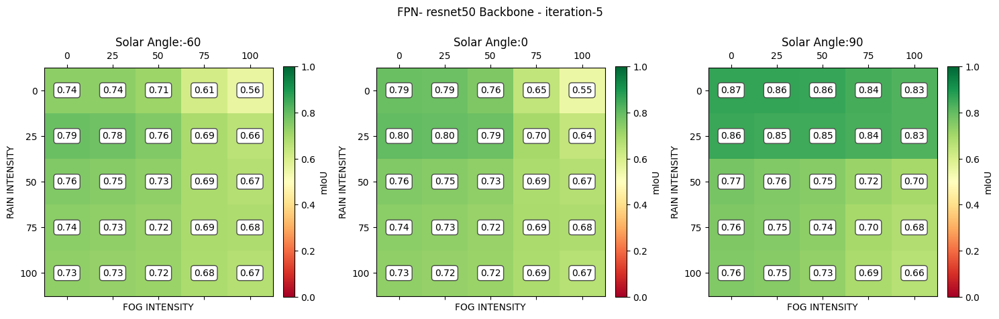

...

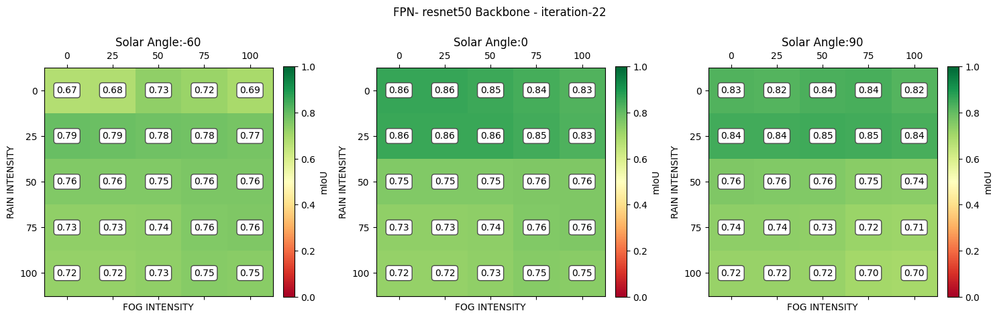

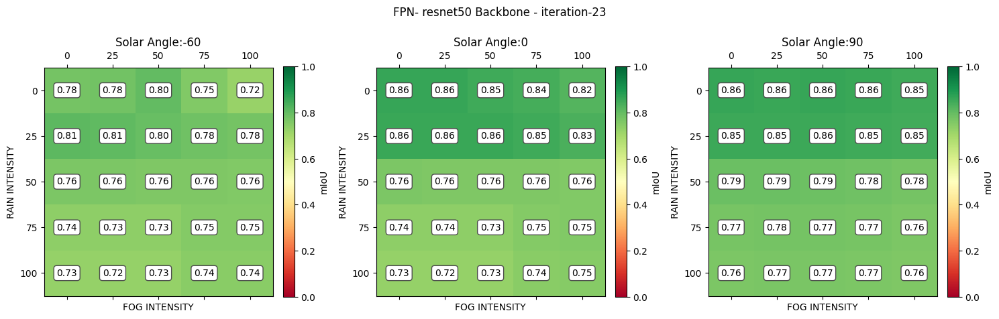

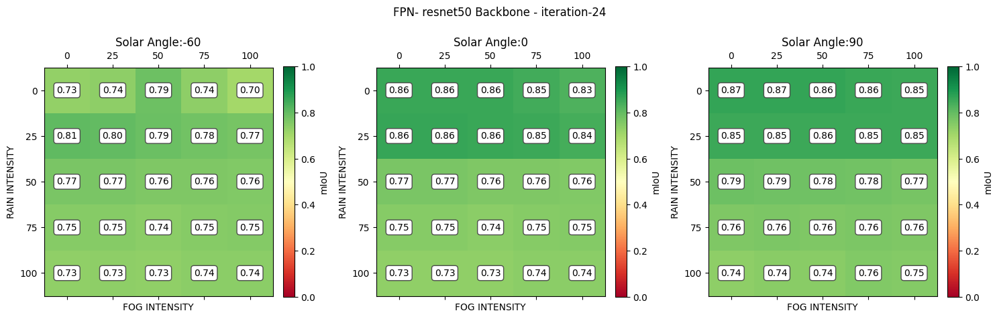

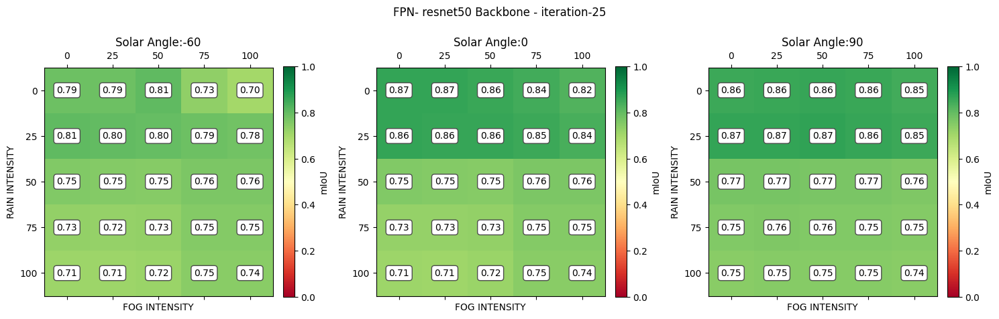

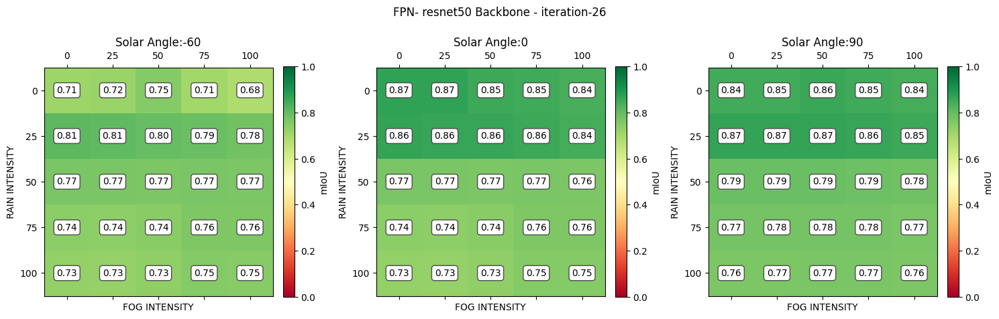

In [7]:


for iter in iterations:

    model = 3
    datadir = "/data_fast/venkatesh/carla/metrics/kp_finetune/resnet50/"
    datadir = os.path.join(datadir, iter)
    angles = [-60, 0, 90]
    fogs = [0, 25, 50, 75, 100]
    rains = [0, 25, 50, 75, 100]
    fig, ax = plt.subplots(nrows = 1, ncols = 3, figsize = (15,5))

    for ang,angle in enumerate(angles):
        heatmap = np.zeros(shape = [5,5])
        for i,fog in enumerate(fogs):
            for j,rain in enumerate(rains):
                filtered = meta_df[(meta_df["sun_altitude_angle"]==angle) & (meta_df['precipitation']==rain) & (meta_df['fog_density']==fog)]
                scene = filtered[filtered['scenarios'].str.contains(f"model{model}")].scenarios.values[0]
                metrics_file = os.path.join(datadir, f"{scene}.json")
                miou, ipo_pc = get_mean_from_metric(metrics_file)
                heatmap[i,j] = miou
        
        im = ax[ang].matshow(heatmap, cmap = "RdYlGn", vmin = 0, vmax = 1)
        for (i, j), z in np.ndenumerate(heatmap):
            ax[ang].text(j, i, '{:0.2f}'.format(z), ha='center', va='center',
                    bbox=dict(boxstyle='round', facecolor='white', edgecolor='0.3'))
        ax[ang].set_title(f"Solar Angle:{angle}")
        ax[ang].set_xlabel("FOG INTENSITY")
        ax[ang].set_xticks([0,1,2,3,4])
        ax[ang].set_xticklabels(fogs)
        ax[ang].set_ylabel("RAIN INTENSITY")
        ax[ang].set_yticks([0,1,2,3,4])
        ax[ang].set_yticklabels(rains)
        # if ang == 2:
        cbar = fig.colorbar(im, fraction=0.046, pad=0.04)
        cbar.set_label("mIoU")
        fig.suptitle(f"FPN- resnet50 Backbone - {iter}")

    plt.tight_layout()
    plt.show()



In [ ]:
import glob
from PIL import Image
import os
import matplotlib.pyplot as plt
import math
datadir = "DATA/carla_test/"

angle  = 90
fog = 0
rain = 100
model = 0


filtered = meta_df[(meta_df["sun_altitude_angle"]==angle) & (meta_df['precipitation']==rain) & (meta_df['fog_density']==fog)]
case = filtered[filtered['scenarios'].str.contains(f"model{model}")].scenarios.values[0]
images = sorted(glob.glob(os.path.join(datadir, case, "rgb_clean", "*")))
image = images[63]
im = Image.open(image)
fig, ax = plt.subplots(nrows = 1, ncols = 1, figsize = (25,20))
ax.imshow(im)
ax.axis('off')
plt.show()

        


In [ ]:
len(images)

In [ ]:
import glob
from PIL import Image
import os
import matplotlib.pyplot as plt
import math
from plot_utils import get_carla_plotting_elements

datadir = "DATA/carla_test/"

angles = [-60, 0, 90]
angle  = 90
fogs = [0, 25, 50, 75, 100]
rains = [0, 25, 50, 75, 100]
model = 3
rain = 0
fog = 0

fig, ax = plt.subplots(nrows = 3, ncols = 5, figsize = (25,10))
class_mapping, color_mapping, cmap, norm, patches = get_carla_plotting_elements()
for i, rain in enumerate(rains):
    filtered = meta_df[(meta_df["sun_altitude_angle"]==angle) & (meta_df['precipitation']==rain) & (meta_df['fog_density']==fog)]
    case = filtered[filtered['scenarios'].str.contains(f"model{model}")].scenarios.values[0]
    images = sorted(glob.glob(os.path.join(datadir, case, "rgb_clean", "*")))
    image = images[63]
    im = Image.open(image)
    prediction_resnet50 = make_prediction(image, "resnet50")
    prediction_segform = make_prediction(image, "MiT")

    ax[0][i].imshow(im)
    ax[0][i].axis('off')
    ax[0][i].set_title(f"Angle {angle} | Fog {fog} | Rain {rain}")

    ax[1][i].imshow(np.argmax(prediction_resnet50, axis = 0), cmap = cmap, norm = norm, interpolation = "nearest")
    ax[1][i].axis('off')
    ax[1][i].set_title("ResNet50")


    ax[2][i].imshow(np.argmax(prediction_segform, axis = 0), cmap = cmap, norm = norm, interpolation = "nearest")
    ax[2][i].axis('off')
    ax[2][i].set_title("MiT")

    plt.tight_layout()

# plt.tight_layout()
# # for ang,angle in enumerate(angles):
# #     heatmap = np.zeros(shape = [5,5])
# for i,fog in enumerate(fogs):
#     for j,rain in enumerate(rains):
#         filtered = meta_df[(meta_df["sun_altitude_angle"]==angle) & (meta_df['precipitation']==rain) & (meta_df['fog_density']==fog)]
#         case = filtered[filtered['scenarios'].str.contains(f"model{model}")].scenarios.values[0]
#         images = sorted(glob.glob(os.path.join(datadir, case, "rgb_clean", "*")))
#         image = images[math.floor(len(images)/2)]
#         im = Image.open(image)
        


In [ ]:
angle  = 0
fogs = [0, 25, 50, 75, 100]
rains = [0, 25, 50, 75, 100]

fig, ax = plt.subplots(nrows = 5, ncols = 5, figsize = (25,20))
class_mapping, color_mapping, cmap, norm, patches = get_carla_plotting_elements()

for i, fog in enumerate(fogs):
    for j, rain in enumerate(rains):
        filtered = meta_df[(meta_df["sun_altitude_angle"]==angle) & (meta_df['precipitation']==rain) & (meta_df['fog_density']==fog)]
        case = filtered[filtered['scenarios'].str.contains(f"model{model}")].scenarios.values[0]
        images = sorted(glob.glob(os.path.join(datadir, case, "rgb_clean", "*")))
        image = images[63]
        im = Image.open(image)
        
        prediction = make_prediction(image, "resnet50")
        
        ax[i][j].imshow(np.argmax(prediction, axis = 0), cmap = cmap, norm = norm, interpolation = "nearest")
        ax[i][j].axis('off')
        ax[i][j].set_title(f"Angle {angle} | Fog {fog} | Rain {rain}")
fig.suptitle("Result Matrix - resnet50")
plt.tight_layout()

# Effects of K-PROJECTION FINE TUNING

In [12]:
import pandas as pd
import os
os.environ['CUDA_VISIBLE_DEVICES'] = "MIG-GPU-ff380879-d5b2-8469-da3d-71267d28a645/0/0"
import json
import numpy as np
import matplotlib.pyplot as plt
import segmentation_models_pytorch as smp
import torch
import torchvision.transforms as tvt
from PIL import Image
import glob
from plot_utils import get_carla_plotting_elements
import torch.nn.functional as F

meta_df = pd.read_csv("carla_test_scenes.csv")

def get_segm_model(backbone, iteration=None):
    if backbone == "resnet50":
        model = smp.FPN(
                encoder_name = "resnet50",
                encoder_depth = 5,
                encoder_weights="imagenet",
                decoder_dropout=0.3,
                in_channels = 3,
                classes=23,
                activation=None
            ).cuda()
        if iteration is None:
            weights = torch.load("checkpoint/CARLA_GEN_SEMANTIC_SEGMENTATION_resnet50(ENCODER)_FPN(DECODER)", map_location="cpu")
        else:
            weights = torch.load(f"checkpoint/kp_finetune/resnet50/CARLA_GEN_SEMANTIC_SEGMENTATION_resnet50(ENCODER)_FPN(DECODER)_{iteration}.pth", map_location="cpu")
        model.load_state_dict(weights['model_state_dict'])
        model.eval()
    elif backbone == "MiT":
        model = smp.FPN(
                encoder_name = "mit_b3",
                encoder_depth = 5,
                encoder_weights="imagenet",
                decoder_dropout=0.3,
                in_channels = 3,
                classes=23,
                activation=None
            ).cuda()
        if iteration is None:
            weights = torch.load("checkpoint/CARLA_GEN_SEMANTIC_SEGMENTATION_MiT(ENCODER)_FPN(DECODER)", map_location="cpu")
        else:
            weights = torch.load(f"checkpoint/kp_finetune/MiT/CARLA_GEN_SEMANTIC_SEGMENTATION_MiT(ENCODER)_FPN(DECODER)_{iteration}.pth", map_location="cpu")
        model.load_state_dict(weights['model_state_dict'])
        model.eval()
    elif backbone == "EfficientNet":
        model = smp.FPN(
                encoder_name = "efficientnet-b6",
                encoder_depth = 5,
                encoder_weights="imagenet",
                decoder_dropout=0.3,
                in_channels = 3,
                classes=23,
                activation=None
            ).cuda()
        if iteration is None:
            weights = torch.load("checkpoint/CARLA_GEN_SEMANTIC_SEGMENTATION_efficientnet-b6(ENCODER)_FPN(DECODER)", map_location="cpu")
        else:
            weights = torch.load(f"checkpoint/kp_finetune/efficientnet-b6/CARLA_GEN_SEMANTIC_SEGMENTATION_efficientnet-b6(ENCODER)_FPN(DECODER)_{iteration}.pth", map_location="cpu")
        model.load_state_dict(weights['model_state_dict'])
        model.eval()
    return model

def make_prediction(image, backbone, iteration):
    model = get_segm_model(backbone, iteration)
    validation_image_transform = tvt.Compose([
        tvt.ToTensor(),
        tvt.Normalize(mean = [0.6823, 0.6725, 0.6617], std = [0.2613, 0.2605, 0.2646]),
        tvt.Pad(padding = [0,0,0,16])
    ])
    image = Image.open(image).convert("RGB")
    image = validation_image_transform(image)
    prediction = model(image.unsqueeze(dim = 0).cuda())
    prediction = tvt.functional.pad(img = prediction, padding=[0,0,0,-16])
    prediction = F.softmax(prediction, dim = 1)
    return prediction.squeeze().detach().cpu().numpy()



def get_image_path(angle, rain, fog, index = 63, model=3, image = True):
    datadir = "DATA/carla_test/"
    filtered = meta_df[(meta_df["sun_altitude_angle"]==angle) & (meta_df['precipitation']==rain) & (meta_df['fog_density']==fog)]
    case = filtered[filtered['scenarios'].str.contains(f"model{model}")].scenarios.values[0]
    if image:
        images = sorted(glob.glob(os.path.join(datadir, case, "rgb_clean", "*")))
    else:
        images = sorted(glob.glob(os.path.join(datadir, case, "seg", "*")))
    image = images[index]
    return image

def get_image_path_and_predict(angle, rain, fog, backbone, iteration):
    image = get_image_path(angle, rain, fog)
    prediction = make_prediction(image = image, backbone=backbone, iteration=iteration)
    return prediction

class_mapping, color_mapping, cmap, norm, patches = get_carla_plotting_elements()

# CLEAR CONDITION

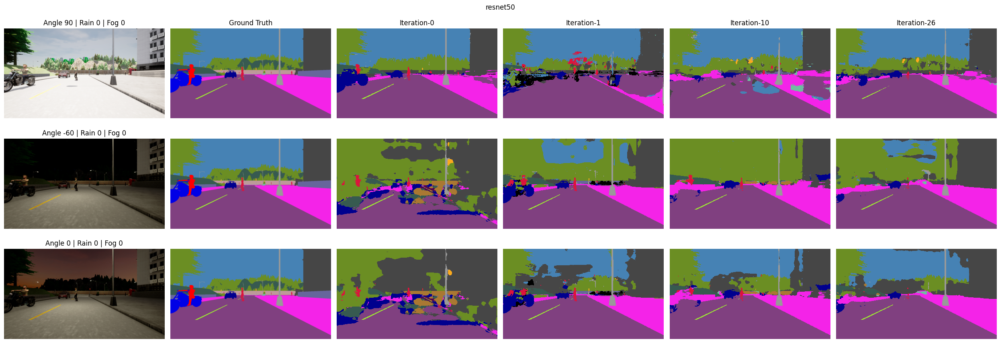

In [13]:
fig, ax = plt.subplots(nrows = 3, ncols=6, figsize=(25,9))


ax[0][0].imshow(Image.open(get_image_path(90, 0, 0)))
ax[0][0].set_title(f"Angle 90 | Rain 0 | Fog 0")
ax[1][0].imshow(Image.open(get_image_path(-60, 0, 0)))
ax[1][0].set_title(f"Angle -60 | Rain 0 | Fog 0")
ax[2][0].imshow(Image.open(get_image_path(0, 0, 0)))
ax[2][0].set_title(f"Angle 0 | Rain 0 | Fog 0")

ax[0][1].imshow(Image.open(get_image_path(90, 0, 0, image = False)))
ax[0][1].set_title(f"Ground Truth")
ax[1][1].imshow(Image.open(get_image_path(-60, 0, 0, image = False)))
ax[2][1].imshow(Image.open(get_image_path(0, 0, 0, image = False)))

ax[0][2].imshow(np.argmax(get_image_path_and_predict(90, 0, 0, "resnet50", None), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[0][2].set_title("Iteration-0")
ax[1][2].imshow(np.argmax(get_image_path_and_predict(-60, 0, 0, "resnet50", None), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[2][2].imshow(np.argmax(get_image_path_and_predict(0, 0, 0, "resnet50", None), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")

ax[0][3].imshow(np.argmax(get_image_path_and_predict(90, 0, 0, "resnet50", "iteration-1"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[0][3].set_title("Iteration-1")
ax[1][3].imshow(np.argmax(get_image_path_and_predict(-60, 0, 0, "resnet50", "iteration-1"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[2][3].imshow(np.argmax(get_image_path_and_predict(0, 0, 0, "resnet50", "iteration-1"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")

ax[0][4].imshow(np.argmax(get_image_path_and_predict(90, 0, 0, "resnet50", "iteration-10"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[0][4].set_title("Iteration-10")
ax[1][4].imshow(np.argmax(get_image_path_and_predict(-60, 0, 0, "resnet50", "iteration-10"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[2][4].imshow(np.argmax(get_image_path_and_predict(0, 0, 0, "resnet50", "iteration-10"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")

ax[0][5].imshow(np.argmax(get_image_path_and_predict(90, 0, 0, "resnet50", "iteration-26"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[0][5].set_title("Iteration-26")
ax[1][5].imshow(np.argmax(get_image_path_and_predict(-60, 0, 0, "resnet50", "iteration-26"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[2][5].imshow(np.argmax(get_image_path_and_predict(0, 0, 0, "resnet50", "iteration-26"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")


ax = ax.flatten()
for a in ax:
    a.axis("off")
fig.suptitle("resnet50")
plt.tight_layout()
plt.show()

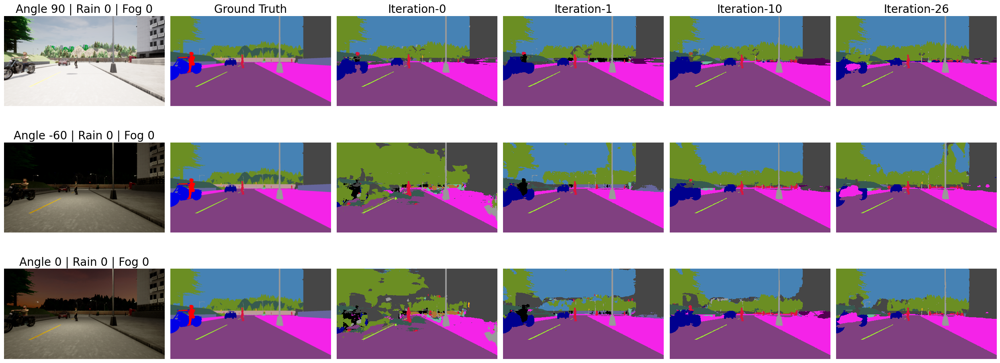

In [6]:
fig, ax = plt.subplots(nrows = 3, ncols=6, figsize=(25,10))

ax[0][0].imshow(Image.open(get_image_path(90, 0, 0)))
ax[0][0].set_title(f"Angle 90 | Rain 0 | Fog 0", fontsize=20)
ax[1][0].imshow(Image.open(get_image_path(-60, 0, 0)))
ax[1][0].set_title(f"Angle -60 | Rain 0 | Fog 0", fontsize=20)
ax[2][0].imshow(Image.open(get_image_path(0, 0, 0)))
ax[2][0].set_title(f"Angle 0 | Rain 0 | Fog 0", fontsize=20)

ax[0][1].imshow(Image.open(get_image_path(90, 0, 0, image = False)))
ax[0][1].set_title(f"Ground Truth", fontsize=20)
ax[1][1].imshow(Image.open(get_image_path(-60, 0, 0, image = False)))
ax[2][1].imshow(Image.open(get_image_path(0, 0, 0, image = False)))

ax[0][2].imshow(np.argmax(get_image_path_and_predict(90, 0, 0, "MiT", None), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[0][2].set_title("Iteration-0", fontsize=20)
ax[1][2].imshow(np.argmax(get_image_path_and_predict(-60, 0, 0, "MiT", None), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[2][2].imshow(np.argmax(get_image_path_and_predict(0, 0, 0, "MiT", None), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")

ax[0][3].imshow(np.argmax(get_image_path_and_predict(90, 0, 0, "MiT", "iteration-1"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[0][3].set_title("Iteration-1", fontsize=20)
ax[1][3].imshow(np.argmax(get_image_path_and_predict(-60, 0, 0, "MiT", "iteration-1"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[2][3].imshow(np.argmax(get_image_path_and_predict(0, 0, 0, "MiT", "iteration-1"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")

ax[0][4].imshow(np.argmax(get_image_path_and_predict(90, 0, 0, "MiT", "iteration-10"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[0][4].set_title("Iteration-10", fontsize=20)
ax[1][4].imshow(np.argmax(get_image_path_and_predict(-60, 0, 0, "MiT", "iteration-10"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[2][4].imshow(np.argmax(get_image_path_and_predict(0, 0, 0, "MiT", "iteration-10"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")

ax[0][5].imshow(np.argmax(get_image_path_and_predict(90, 0, 0, "MiT", "iteration-23"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[0][5].set_title("Iteration-26", fontsize=20)
ax[1][5].imshow(np.argmax(get_image_path_and_predict(-60, 0, 0, "MiT", "iteration-26"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[2][5].imshow(np.argmax(get_image_path_and_predict(0, 0, 0, "MiT", "iteration-26"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")

# ax[0][5].imshow(np.max(get_image_path_and_predict(90, 0, 0, "MiT", "iteration-23"), axis = 0), cmap="jet", interpolation = "nearest")
# ax[0][5].set_title("Iteration-26", fontsize=20)
# ax[1][5].imshow(np.max(get_image_path_and_predict(-60, 0, 0, "MiT", "iteration-26"), axis = 0), cmap="jet", interpolation = "nearest")
# ax[2][5].imshow(np.max(get_image_path_and_predict(0, 0, 0, "MiT", "iteration-26"), axis = 0), cmap="jet", interpolation = "nearest")

ax = ax.flatten()
for a in ax:
    a.axis("off")
# fig.suptitle("MiT_b3")
plt.tight_layout()
# plt.savefig("FPN-MiT-predictions.pdf", format="pdf")
plt.show()

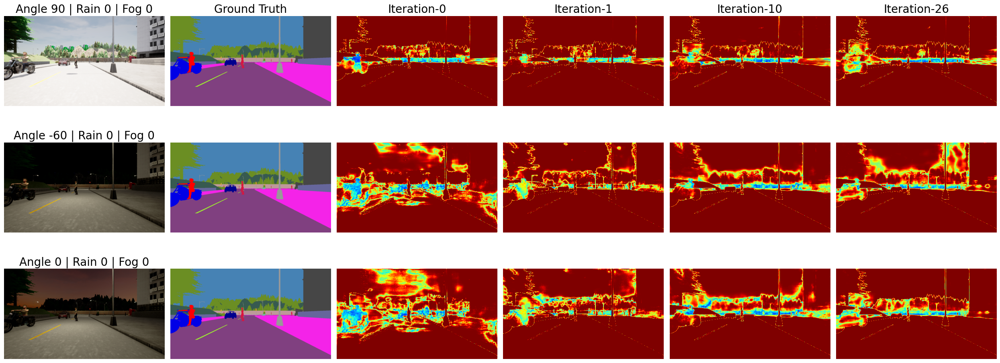

In [9]:
fig, ax = plt.subplots(nrows = 3, ncols=6, figsize=(25,10))

ax[0][0].imshow(Image.open(get_image_path(90, 0, 0)))
ax[0][0].set_title(f"Angle 90 | Rain 0 | Fog 0", fontsize=20)
ax[1][0].imshow(Image.open(get_image_path(-60, 0, 0)))
ax[1][0].set_title(f"Angle -60 | Rain 0 | Fog 0", fontsize=20)
ax[2][0].imshow(Image.open(get_image_path(0, 0, 0)))
ax[2][0].set_title(f"Angle 0 | Rain 0 | Fog 0", fontsize=20)

ax[0][1].imshow(Image.open(get_image_path(90, 0, 0, image = False)))
ax[0][1].set_title(f"Ground Truth", fontsize=20)
ax[1][1].imshow(Image.open(get_image_path(-60, 0, 0, image = False)))
ax[2][1].imshow(Image.open(get_image_path(0, 0, 0, image = False)))

ax[0][2].imshow(np.max(get_image_path_and_predict(90, 0, 0, "MiT", None), axis = 0), cmap="jet", interpolation = "nearest", vmin = 0, vmax = 1)
ax[0][2].set_title("Iteration-0", fontsize=20)
ax[1][2].imshow(np.max(get_image_path_and_predict(-60, 0, 0, "MiT", None), axis = 0), cmap="jet", interpolation = "nearest", vmin = 0, vmax = 1)
ax[2][2].imshow(np.max(get_image_path_and_predict(0, 0, 0, "MiT", None), axis = 0), cmap="jet", interpolation = "nearest", vmin = 0, vmax = 1)

ax[0][3].imshow(np.max(get_image_path_and_predict(90, 0, 0, "MiT", "iteration-1"), axis = 0), cmap="jet", interpolation = "nearest", vmin = 0, vmax = 1)
ax[0][3].set_title("Iteration-1", fontsize=20)
ax[1][3].imshow(np.max(get_image_path_and_predict(-60, 0, 0, "MiT", "iteration-1"), axis = 0), cmap="jet", interpolation = "nearest", vmin = 0, vmax = 1)
ax[2][3].imshow(np.max(get_image_path_and_predict(0, 0, 0, "MiT", "iteration-1"), axis = 0), cmap="jet", interpolation = "nearest", vmin = 0, vmax = 1)

ax[0][4].imshow(np.max(get_image_path_and_predict(90, 0, 0, "MiT", "iteration-10"), axis = 0), cmap="jet", interpolation = "nearest", vmin = 0, vmax = 1)
ax[0][4].set_title("Iteration-10", fontsize=20)
ax[1][4].imshow(np.max(get_image_path_and_predict(-60, 0, 0, "MiT", "iteration-10"), axis = 0), cmap="jet", interpolation = "nearest", vmin = 0, vmax = 1)
ax[2][4].imshow(np.max(get_image_path_and_predict(0, 0, 0, "MiT", "iteration-10"), axis = 0), cmap="jet", interpolation = "nearest", vmin = 0, vmax = 1)

ax[0][5].imshow(np.max(get_image_path_and_predict(90, 0, 0, "MiT", "iteration-23"), axis = 0), cmap="jet", interpolation = "nearest", vmin = 0, vmax = 1)
ax[0][5].set_title("Iteration-26", fontsize=20)
ax[1][5].imshow(np.max(get_image_path_and_predict(-60, 0, 0, "MiT", "iteration-26"), axis = 0), cmap="jet", interpolation = "nearest", vmin = 0, vmax = 1)
ax[2][5].imshow(np.max(get_image_path_and_predict(0, 0, 0, "MiT", "iteration-26"), axis = 0), cmap="jet", interpolation = "nearest", vmin = 0, vmax = 1)


ax = ax.flatten()
for a in ax:
    a.axis("off")
# fig.suptitle("MiT_b3")
plt.tight_layout()
# plt.savefig("FPN-MiT-predictions.pdf", format="pdf")
plt.show()

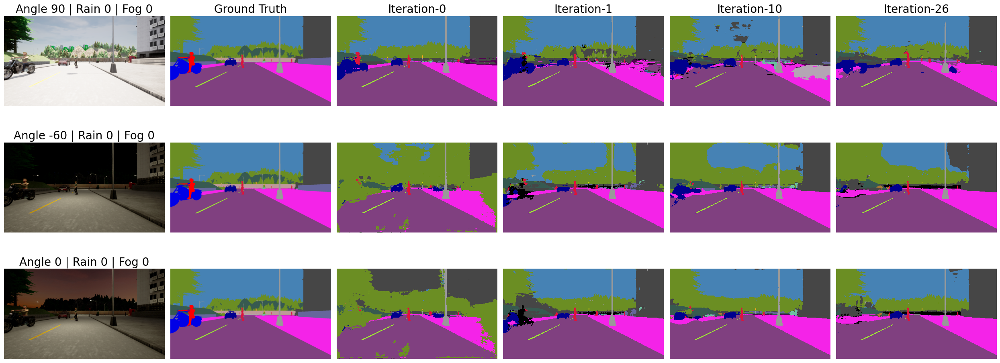

In [24]:
fig, ax = plt.subplots(nrows = 3, ncols=6, figsize=(25,10))

ax[0][0].imshow(Image.open(get_image_path(90, 0, 0)))
ax[0][0].set_title(f"Angle 90 | Rain 0 | Fog 0", fontsize=20)
ax[1][0].imshow(Image.open(get_image_path(-60, 0, 0)))
ax[1][0].set_title(f"Angle -60 | Rain 0 | Fog 0", fontsize=20)
ax[2][0].imshow(Image.open(get_image_path(0, 0, 0)))
ax[2][0].set_title(f"Angle 0 | Rain 0 | Fog 0", fontsize=20)

ax[0][1].imshow(Image.open(get_image_path(90, 0, 0, image = False)))
ax[0][1].set_title(f"Ground Truth", fontsize=20)
ax[1][1].imshow(Image.open(get_image_path(-60, 0, 0, image = False)))
ax[2][1].imshow(Image.open(get_image_path(0, 0, 0, image = False)))

ax[0][2].imshow(np.argmax(get_image_path_and_predict(90, 0, 0, "EfficientNet", None), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[0][2].set_title("Iteration-0", fontsize=20)
ax[1][2].imshow(np.argmax(get_image_path_and_predict(-60, 0, 0, "EfficientNet", None), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[2][2].imshow(np.argmax(get_image_path_and_predict(0, 0, 0, "EfficientNet", None), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")

ax[0][3].imshow(np.argmax(get_image_path_and_predict(90, 0, 0, "EfficientNet", "iteration-1"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[0][3].set_title("Iteration-1", fontsize=20)
ax[1][3].imshow(np.argmax(get_image_path_and_predict(-60, 0, 0, "EfficientNet", "iteration-1"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[2][3].imshow(np.argmax(get_image_path_and_predict(0, 0, 0, "EfficientNet", "iteration-1"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")

ax[0][4].imshow(np.argmax(get_image_path_and_predict(90, 0, 0, "EfficientNet", "iteration-10"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[0][4].set_title("Iteration-10", fontsize=20)
ax[1][4].imshow(np.argmax(get_image_path_and_predict(-60, 0, 0, "EfficientNet", "iteration-10"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[2][4].imshow(np.argmax(get_image_path_and_predict(0, 0, 0, "EfficientNet", "iteration-10"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")

ax[0][5].imshow(np.argmax(get_image_path_and_predict(90, 0, 0, "EfficientNet", "iteration-23"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[0][5].set_title("Iteration-26", fontsize=20)
ax[1][5].imshow(np.argmax(get_image_path_and_predict(-60, 0, 0, "EfficientNet", "iteration-26"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[2][5].imshow(np.argmax(get_image_path_and_predict(0, 0, 0, "EfficientNet", "iteration-26"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")


ax = ax.flatten()
for a in ax:
    a.axis("off")
plt.tight_layout()
plt.savefig("FPN-EfficientNet-predictions.pdf", format="pdf")
plt.show()

# MODERATE RAIN

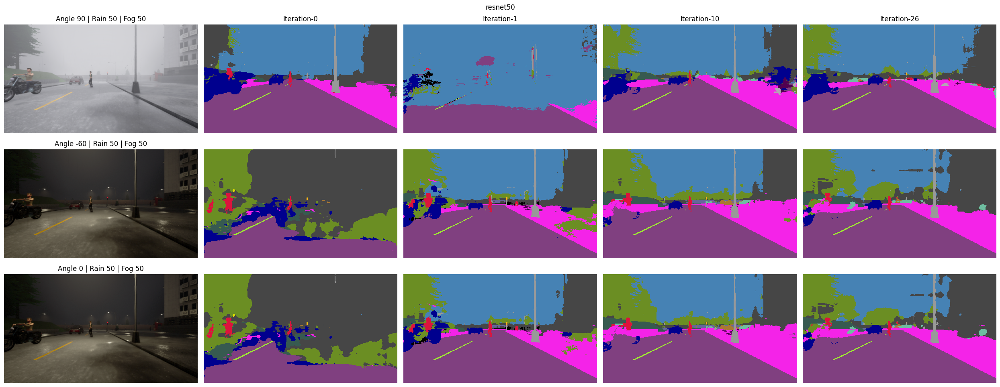

In [52]:
fig, ax = plt.subplots(nrows = 3, ncols=5, figsize=(25,10))


ax[0][0].imshow(Image.open(get_image_path(90, 50, 50)))
ax[0][0].set_title(f"Angle 90 | Rain 50 | Fog 50", fontsize=20)
ax[1][0].imshow(Image.open(get_image_path(-60, 50, 50)))
ax[1][0].set_title(f"Angle -60 | Rain 50 | Fog 50", fontsize=20)
ax[2][0].imshow(Image.open(get_image_path(0, 50, 50)))
ax[2][0].set_title(f"Angle 0 | Rain 50 | Fog 50", fontsize=20)

ax[0][1].imshow(np.argmax(get_image_path_and_predict(90, 50, 50, "resnet50", None), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[0][1].set_title("Iteration-0", fontsize=20)
ax[1][1].imshow(np.argmax(get_image_path_and_predict(-60, 50, 50, "resnet50", None), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[2][1].imshow(np.argmax(get_image_path_and_predict(0, 50, 50, "resnet50", None), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")

ax[0][2].imshow(np.argmax(get_image_path_and_predict(90, 50, 50, "resnet50", "iteration-1"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[0][2].set_title("Iteration-1", fontsize=20)
ax[1][2].imshow(np.argmax(get_image_path_and_predict(-60, 50, 50, "resnet50", "iteration-1"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[2][2].imshow(np.argmax(get_image_path_and_predict(0, 50, 50, "resnet50", "iteration-1"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")

ax[0][3].imshow(np.argmax(get_image_path_and_predict(90,50, 50, "resnet50", "iteration-10"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[0][3].set_title("Iteration-10", fontsize=20)
ax[1][3].imshow(np.argmax(get_image_path_and_predict(-60, 50, 50, "resnet50", "iteration-10"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[2][3].imshow(np.argmax(get_image_path_and_predict(0, 50, 50, "resnet50", "iteration-10"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")

ax[0][4].imshow(np.argmax(get_image_path_and_predict(90, 50, 50, "resnet50", "iteration-26"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[0][4].set_title("Iteration-26", fontsize=20)
ax[1][4].imshow(np.argmax(get_image_path_and_predict(-60, 50, 50, "resnet50", "iteration-26"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[2][4].imshow(np.argmax(get_image_path_and_predict(0,50, 50, "resnet50", "iteration-26"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")


ax = ax.flatten()
for a in ax:
    a.axis("off")
fig.suptitle("resnet50")
plt.tight_layout()
plt.show()

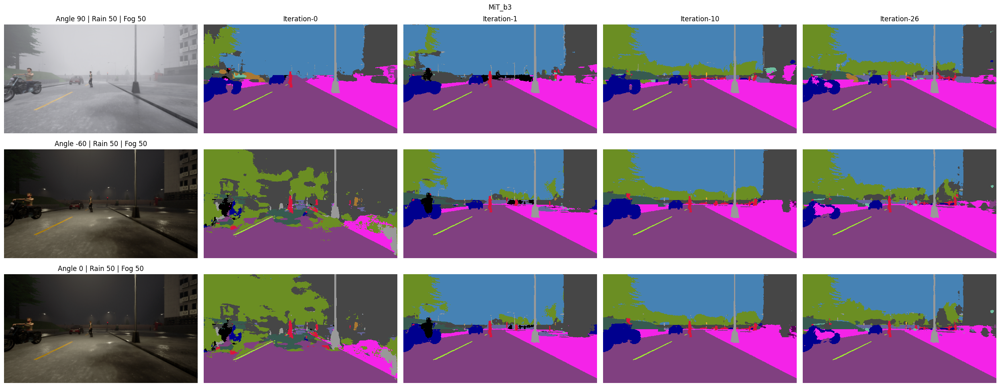

In [54]:
fig, ax = plt.subplots(nrows = 3, ncols=5, figsize=(25,10))


ax[0][0].imshow(Image.open(get_image_path(90, 50, 50)))
ax[0][0].set_title(f"Angle 90 | Rain 50 | Fog 50")
ax[1][0].imshow(Image.open(get_image_path(-60, 50, 50)))
ax[1][0].set_title(f"Angle -60 | Rain 50 | Fog 50")
ax[2][0].imshow(Image.open(get_image_path(0, 50, 50)))
ax[2][0].set_title(f"Angle 0 | Rain 50 | Fog 50")

ax[0][1].imshow(np.argmax(get_image_path_and_predict(90, 50, 50, "MiT", None), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[0][1].set_title("Iteration-0")
ax[1][1].imshow(np.argmax(get_image_path_and_predict(-60, 50, 50, "MiT", None), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[2][1].imshow(np.argmax(get_image_path_and_predict(0, 50, 50, "MiT", None), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")

ax[0][2].imshow(np.argmax(get_image_path_and_predict(90, 50, 50, "MiT", "iteration-1"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[0][2].set_title("Iteration-1")
ax[1][2].imshow(np.argmax(get_image_path_and_predict(-60, 50, 50, "MiT", "iteration-1"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[2][2].imshow(np.argmax(get_image_path_and_predict(0, 50, 50, "MiT", "iteration-1"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")

ax[0][3].imshow(np.argmax(get_image_path_and_predict(90,50, 50, "MiT", "iteration-10"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[0][3].set_title("Iteration-10")
ax[1][3].imshow(np.argmax(get_image_path_and_predict(-60, 50, 50, "MiT", "iteration-10"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[2][3].imshow(np.argmax(get_image_path_and_predict(0, 50, 50, "MiT", "iteration-10"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")

ax[0][4].imshow(np.argmax(get_image_path_and_predict(90, 50, 50, "MiT", "iteration-23"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[0][4].set_title("Iteration-26")
ax[1][4].imshow(np.argmax(get_image_path_and_predict(-60, 50, 50, "MiT", "iteration-23"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[2][4].imshow(np.argmax(get_image_path_and_predict(0,50, 50, "MiT", "iteration-23"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")


ax = ax.flatten()
for a in ax:
    a.axis("off")
fig.suptitle("MiT_b3")
plt.tight_layout()
plt.show()

# Mix Vision Transformer backbone

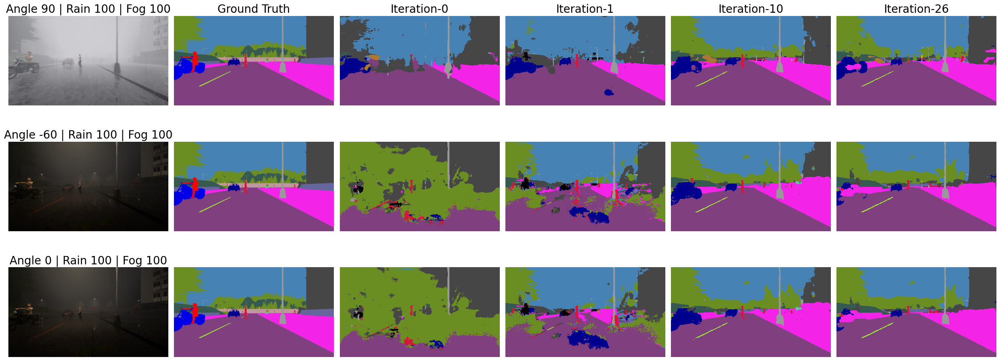

In [25]:
fig, ax = plt.subplots(nrows = 3, ncols=6, figsize=(25,10))


ax[0][0].imshow(Image.open(get_image_path(90, 100, 100)))
ax[0][0].set_title(f"Angle 90 | Rain 100 | Fog 100", fontsize=20)
ax[1][0].imshow(Image.open(get_image_path(-60, 100, 100)))
ax[1][0].set_title(f"Angle -60 | Rain 100 | Fog 100", fontsize=20)
ax[2][0].imshow(Image.open(get_image_path(0, 100, 100)))
ax[2][0].set_title(f"Angle 0 | Rain 100 | Fog 100", fontsize=20)

ax[0][1].imshow(Image.open(get_image_path(90, 100, 100, image = False)))
ax[0][1].set_title(f"Ground Truth", fontsize=20)
ax[1][1].imshow(Image.open(get_image_path(-60, 100, 100, image = False)))
ax[2][1].imshow(Image.open(get_image_path(0, 100, 100, image = False)))

ax[0][2].imshow(np.argmax(get_image_path_and_predict(90, 100, 100, "MiT", None), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[0][2].set_title("Iteration-0", fontsize=20)
ax[1][2].imshow(np.argmax(get_image_path_and_predict(-60, 100, 100, "MiT", None), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[2][2].imshow(np.argmax(get_image_path_and_predict(0, 100, 100, "MiT", None), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")

ax[0][3].imshow(np.argmax(get_image_path_and_predict(90, 100, 100, "MiT", "iteration-1"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[0][3].set_title("Iteration-1", fontsize=20)
ax[1][3].imshow(np.argmax(get_image_path_and_predict(-60, 100, 100, "MiT", "iteration-1"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[2][3].imshow(np.argmax(get_image_path_and_predict(0, 100, 100, "MiT", "iteration-1"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")

ax[0][4].imshow(np.argmax(get_image_path_and_predict(90,100, 100, "MiT", "iteration-10"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[0][4].set_title("Iteration-10", fontsize=20)
ax[1][4].imshow(np.argmax(get_image_path_and_predict(-60, 100, 100, "MiT", "iteration-10"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[2][4].imshow(np.argmax(get_image_path_and_predict(0, 100, 100, "MiT", "iteration-10"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")

ax[0][5].imshow(np.argmax(get_image_path_and_predict(90, 100, 100, "MiT", "iteration-23"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[0][5].set_title("Iteration-26", fontsize=20)
ax[1][5].imshow(np.argmax(get_image_path_and_predict(-60, 100, 100, "MiT", "iteration-26"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[2][5].imshow(np.argmax(get_image_path_and_predict(0,100, 100, "MiT", "iteration-26"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")


ax = ax.flatten()
for a in ax:
    a.axis("off")
plt.tight_layout()
plt.savefig("FPN-MiT-predictions-bad.pdf", format="pdf")
plt.show()

# Efficient net model

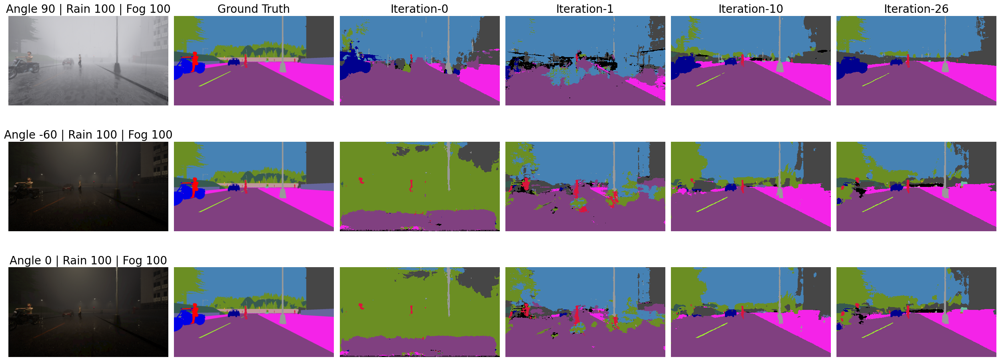

In [26]:
fig, ax = plt.subplots(nrows = 3, ncols=6, figsize=(25,10))


ax[0][0].imshow(Image.open(get_image_path(90, 100, 100)))
ax[0][0].set_title(f"Angle 90 | Rain 100 | Fog 100", fontsize=20)
ax[1][0].imshow(Image.open(get_image_path(-60, 100, 100)))
ax[1][0].set_title(f"Angle -60 | Rain 100 | Fog 100", fontsize=20)
ax[2][0].imshow(Image.open(get_image_path(0, 100, 100)))
ax[2][0].set_title(f"Angle 0 | Rain 100 | Fog 100", fontsize=20)

ax[0][1].imshow(Image.open(get_image_path(90, 100, 100, image = False)))
ax[0][1].set_title(f"Ground Truth", fontsize=20)
ax[1][1].imshow(Image.open(get_image_path(-60, 100, 100, image = False)))
ax[2][1].imshow(Image.open(get_image_path(0, 100, 100, image = False)))

ax[0][2].imshow(np.argmax(get_image_path_and_predict(90, 100, 100, "EfficientNet", None), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[0][2].set_title("Iteration-0", fontsize=20)
ax[1][2].imshow(np.argmax(get_image_path_and_predict(-60, 100, 100, "EfficientNet", None), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[2][2].imshow(np.argmax(get_image_path_and_predict(0, 100, 100, "EfficientNet", None), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")

ax[0][3].imshow(np.argmax(get_image_path_and_predict(90, 100, 100, "EfficientNet", "iteration-1"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[0][3].set_title("Iteration-1", fontsize=20)
ax[1][3].imshow(np.argmax(get_image_path_and_predict(-60, 100, 100, "EfficientNet", "iteration-1"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[2][3].imshow(np.argmax(get_image_path_and_predict(0, 100, 100, "EfficientNet", "iteration-1"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")

ax[0][4].imshow(np.argmax(get_image_path_and_predict(90,100, 100, "EfficientNet", "iteration-10"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[0][4].set_title("Iteration-10", fontsize=20)
ax[1][4].imshow(np.argmax(get_image_path_and_predict(-60, 100, 100, "EfficientNet", "iteration-10"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[2][4].imshow(np.argmax(get_image_path_and_predict(0, 100, 100, "EfficientNet", "iteration-10"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")

ax[0][5].imshow(np.argmax(get_image_path_and_predict(90, 100, 100, "EfficientNet", "iteration-26"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[0][5].set_title("Iteration-26", fontsize=20)
ax[1][5].imshow(np.argmax(get_image_path_and_predict(-60, 100, 100, "EfficientNet", "iteration-26"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[2][5].imshow(np.argmax(get_image_path_and_predict(0,100, 100, "EfficientNet", "iteration-26"), axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")


ax = ax.flatten()
for a in ax:
    a.axis("off")
plt.tight_layout()
plt.savefig("FPN-EfficientNet-predictions-bad.pdf", format="pdf")
plt.show()

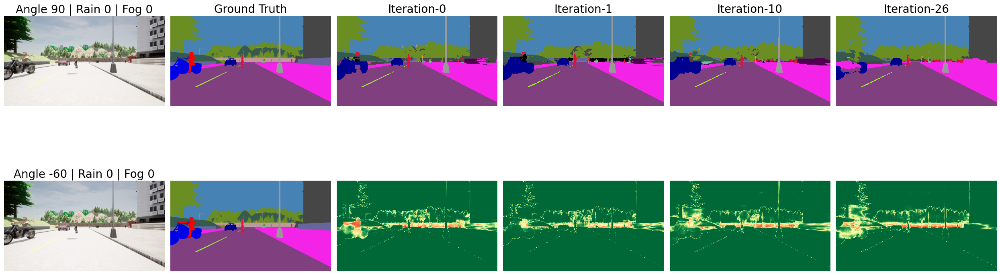

In [19]:
fig, ax = plt.subplots(nrows = 2, ncols=6, figsize=(25,10))

ax[0][0].imshow(Image.open(get_image_path(90, 0, 0)))
ax[0][0].set_title(f"Angle 90 | Rain 0 | Fog 0", fontsize=20)
ax[1][0].imshow(Image.open(get_image_path(90, 0, 0)))
ax[1][0].set_title(f"Angle -60 | Rain 0 | Fog 0", fontsize=20)

ax[0][1].imshow(Image.open(get_image_path(90, 0, 0, image = False)))
ax[0][1].set_title(f"Ground Truth", fontsize=20)
ax[1][1].imshow(Image.open(get_image_path(90, 0, 0, image = False)))

prediction = get_image_path_and_predict(90, 0, 0, "MiT", None)
ax[0][2].imshow(np.argmax(prediction, axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[0][2].set_title("Iteration-0", fontsize=20)
ax[1][2].imshow(np.max(prediction, axis = 0), cmap="RdYlGn", vmin = 0, vmax = 1, interpolation = "nearest")

prediction = get_image_path_and_predict(90, 0, 0, "MiT", "iteration-1")
ax[0][3].imshow(np.argmax(prediction, axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[0][3].set_title("Iteration-1", fontsize=20)
ax[1][3].imshow(np.max(prediction, axis = 0), cmap="RdYlGn", vmin = 0, vmax = 1, interpolation = "nearest")

prediction = get_image_path_and_predict(90, 0, 0, "MiT", "iteration-10")
ax[0][4].imshow(np.argmax(prediction, axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[0][4].set_title("Iteration-10", fontsize=20)
ax[1][4].imshow(np.max(prediction, axis = 0), cmap="RdYlGn", vmin = 0, vmax = 1, interpolation = "nearest")

prediction = get_image_path_and_predict(90, 0, 0, "MiT", "iteration-26")
ax[0][5].imshow(np.argmax(prediction, axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[0][5].set_title("Iteration-26", fontsize=20)
ax[1][5].imshow(np.max(prediction, axis = 0), cmap="RdYlGn", vmin = 0, vmax = 1, interpolation = "nearest")



ax = ax.flatten()
for a in ax:
    a.axis("off")
# fig.suptitle("MiT_b3")
plt.tight_layout()
# plt.savefig("FPN-MiT-predictions.pdf", format="pdf")
plt.show()

# Softmax confidence

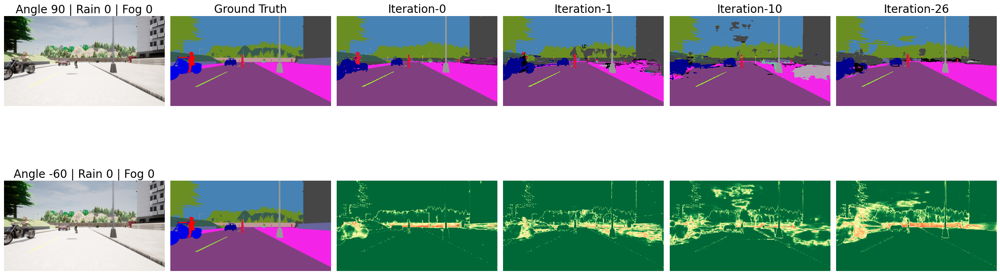

In [21]:
fig, ax = plt.subplots(nrows = 2, ncols=6, figsize=(25,10))

ax[0][0].imshow(Image.open(get_image_path(90, 0, 0)))
ax[0][0].set_title(f"Angle 90 | Rain 0 | Fog 0", fontsize=20)
ax[1][0].imshow(Image.open(get_image_path(90, 0, 0)))
ax[1][0].set_title(f"Angle -60 | Rain 0 | Fog 0", fontsize=20)

ax[0][1].imshow(Image.open(get_image_path(90, 0, 0, image = False)))
ax[0][1].set_title(f"Ground Truth", fontsize=20)
ax[1][1].imshow(Image.open(get_image_path(90, 0, 0, image = False)))

prediction = get_image_path_and_predict(90, 0, 0, "EfficientNet", None)
ax[0][2].imshow(np.argmax(prediction, axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[0][2].set_title("Iteration-0", fontsize=20)
ax[1][2].imshow(np.max(prediction, axis = 0), cmap="RdYlGn", vmin = 0, vmax = 1, interpolation = "nearest")

prediction = get_image_path_and_predict(90, 0, 0, "EfficientNet", "iteration-1")
ax[0][3].imshow(np.argmax(prediction, axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[0][3].set_title("Iteration-1", fontsize=20)
ax[1][3].imshow(np.max(prediction, axis = 0), cmap="RdYlGn", vmin = 0, vmax = 1, interpolation = "nearest")

prediction = get_image_path_and_predict(90, 0, 0, "EfficientNet", "iteration-10")
ax[0][4].imshow(np.argmax(prediction, axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[0][4].set_title("Iteration-10", fontsize=20)
ax[1][4].imshow(np.max(prediction, axis = 0), cmap="RdYlGn", vmin = 0, vmax = 1, interpolation = "nearest")

prediction = get_image_path_and_predict(90, 0, 0, "EfficientNet", "iteration-26")
ax[0][5].imshow(np.argmax(prediction, axis = 0), cmap=cmap, norm = norm, interpolation = "nearest")
ax[0][5].set_title("Iteration-26", fontsize=20)
ax[1][5].imshow(np.max(prediction, axis = 0), cmap="RdYlGn", vmin = 0, vmax = 1, interpolation = "nearest")



ax = ax.flatten()
for a in ax:
    a.axis("off")
# fig.suptitle("MiT_b3")
plt.tight_layout()
# plt.savefig("FPN-MiT-predictions.pdf", format="pdf")
plt.show()

In [7]:
def make_heatmap(metric_dir, angles=[-60, 0, 90], rains=[0, 25, 50, 75, 100], fogs=[0, 25, 50, 75, 100], model=3):
    heatmap_dict = {}
    for angle in angles:

        heatmap = np.zeros(shape=[len(fogs), len(rains)])
        for i, fog in enumerate(fogs):
            for j, rain in enumerate(rains):
                filtered = meta_df[(meta_df['sun_altitude_angle']==angle) & (meta_df['precipitation']==rain) & (meta_df['fog_density']==fog)]
                scene = filtered[filtered['scenarios'].str.contains(f"model{model}")].scenarios.values[0]
                metric_file = os.path.join(metric_dir, f"{scene}.json")
                miou, iou_pc = get_mean_from_metric(metric_file)
                heatmap[i, j] = miou
        heatmap_dict[angle] = heatmap
    return heatmap_dict

meta_df = pd.read_csv("carla_test_scenes.csv")
hmap_iters_resnet = {}
iteration_0 = make_heatmap(metric_dir="/data_fast/venkatesh/carla/metrics/semantic/FPN/mit_b3")
hmap_iters_resnet['iteration-0'] = iteration_0

iterations = [f"iteration-{i}" for i in range(1,27)]
for iter in iterations:
    datadir = "/data_fast/venkatesh/carla/metrics/kp_finetune_all/MiT/"
    metric_dir = os.path.join(datadir, iter)
    hmap_iters_resnet[iter] = make_heatmap(metric_dir)

In [38]:
def label_with_parameters(iter):
    configs = pd.read_csv("DATA/k-projection/configs.csv")
    row = configs.loc[configs.iteration==iter]

    return f"r={row.rain.values[0]},f={row.fog.values[0]},a={row.angle.values[0]}"
label_with_parameters("iteration-1")


y = [hmap_iters_resnet[iter][-60][4][4] for iter in hmap_iters_resnet.keys()]
x =  [label_with_parameters(iter) for iter in hmap_iters_resnet.keys()]
x = [scene.replace("iteration", "scenario") for scene in x]


print(x)
print(y)

['r=0,f=0,a=90', 'r=25,f=50,a=-60', 'r=100,f=75,a=90', 'r=75,f=25,a=90', 'r=50,f=100,a=0', 'r=0,f=75,a=-60', 'r=25,f=100,a=90', 'r=50,f=25,a=-60', 'r=75,f=50,a=0', 'r=100,f=0,a=-60', 'r=50,f=50,a=90', 'r=100,f=25,a=0', 'r=25,f=75,a=0', 'r=75,f=100,a=-60', 'r=0,f=0,a=90', 'r=50,f=0,a=-60', 'r=75,f=75,a=-60', 'r=0,f=25,a=-60', 'r=25,f=0,a=0', 'r=0,f=100,a=0', 'r=100,f=50,a=0', 'r=0,f=50,a=-60', 'r=75,f=0,a=0', 'r=50,f=75,a=90', 'r=100,f=100,a=90', 'r=25,f=25,a=90', 'r=100,f=100,a=90']
[0.23854093770186058, 0.6249641978740689, 0.4010188568631804, 0.3390462497373417, 0.7054182519515352, 0.582711250086625, 0.2587382079164182, 0.6276334609587984, 0.752827684084574, 0.6355996733903881, 0.3560880845785137, 0.642342789371808, 0.5696330779790875, 0.6959156322479244, 0.22492343304057869, 0.5549250715970989, 0.7516499720017111, 0.6086748558282848, 0.54675403902928, 0.5555634300907449, 0.7385850057999289, 0.5809107584754623, 0.5159198397397992, 0.2800835819045698, 0.3727157978216803, 0.250503384818

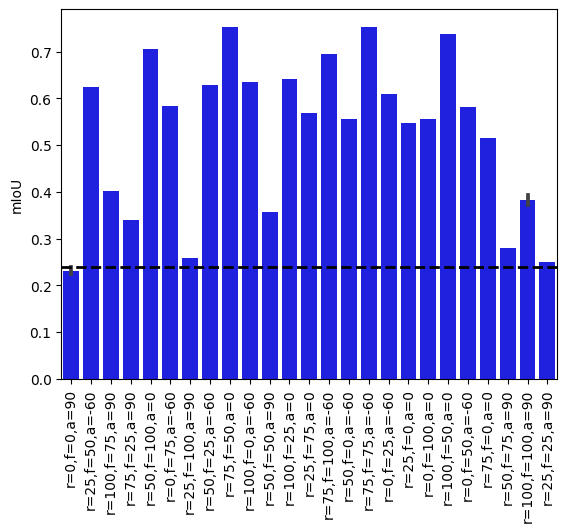

In [40]:
import seaborn as sns

g = sns.barplot(x = x, y = y, color="blue")
g.axhline(y[0], color = "black", linestyle='--', linewidth = 2)
plt.xticks(rotation = 90)
plt.ylabel("mIoU")
plt.show()

In [ ]:
iterations = [f"iteration-{i}" for i in range(1,27)]

